<h1><center><b>Chicago Crime Analysis</b></center></h1>
<h2><center><b>By: Christopher Williams</b></center></h2>
<h3><center><b><a href='https://data.cityofchicago.org/Public-Safety/Crimes-2001-to-Present/ijzp-q8t2/data'>Dataset</a></b></center></h3>
<h4><center><b>Python 3.10</b></center></h4>

<h4><center>Import Statements</center></h4>

In [1]:
import geopandas
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import folium
from folium import plugins
from folium.plugins import HeatMap
from folium.plugins import MarkerCluster
import plotly.express as px

# Import Statements to Follow https://towardsdatascience.com/geopandas-101-plot-any-data-with-a-latitude-and-longitude-on-a-map-98e01944b972
import geopandas as gpd
import descartes
from shapely.geometry import Point, Polygon
import fiona
import webbrowser
import contextily as ctx


<h4><center>Read in Data</center></h4>

In [2]:
df_raw = pd.read_csv('Crimes_-_2001_to_Present.csv')
df_raw = df_raw.dropna(subset=['Longitude'])
df_raw = df_raw.dropna(subset=['Latitude'])
df_raw.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,10224738,HY411648,09/05/2015 01:30:00 PM,043XX S WOOD ST,0486,BATTERY,DOMESTIC BATTERY SIMPLE,RESIDENCE,False,True,...,12.0,61.0,08B,1165074.0,1875917.0,2015,02/10/2018 03:50:01 PM,41.815117,-87.670000,"(41.815117282, -87.669999562)"
1,10224739,HY411615,09/04/2015 11:30:00 AM,008XX N CENTRAL AVE,0870,THEFT,POCKET-PICKING,CTA BUS,False,False,...,29.0,25.0,06,1138875.0,1904869.0,2015,02/10/2018 03:50:01 PM,41.895080,-87.765400,"(41.895080471, -87.765400451)"
3,10224740,HY411595,09/05/2015 12:45:00 PM,035XX W BARRY AVE,2023,NARCOTICS,POSS: HEROIN(BRN/TAN),SIDEWALK,True,False,...,35.0,21.0,18,1152037.0,1920384.0,2015,02/10/2018 03:50:01 PM,41.937406,-87.716650,"(41.937405765, -87.716649687)"
4,10224741,HY411610,09/05/2015 01:00:00 PM,0000X N LARAMIE AVE,0560,ASSAULT,SIMPLE,APARTMENT,False,True,...,28.0,25.0,08A,1141706.0,1900086.0,2015,02/10/2018 03:50:01 PM,41.881903,-87.755121,"(41.881903443, -87.755121152)"
5,10224742,HY411435,09/05/2015 10:55:00 AM,082XX S LOOMIS BLVD,0610,BURGLARY,FORCIBLE ENTRY,RESIDENCE,False,False,...,21.0,71.0,05,1168430.0,1850165.0,2015,02/10/2018 03:50:01 PM,41.744379,-87.658431,"(41.744378879, -87.658430635)"


In [3]:
df_raw['Date'] = pd.to_datetime(df_raw['Date'])

/tmp/ipykernel_100851/3426394340.py:1: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  df_raw['Date'] = pd.to_datetime(df_raw['Date'])


<h4><center>Exploratory Data Analysis</center></h4>
<h4><center>Set Masks for Years and Crime Types</center></h4>

In [4]:
df_raw['Primary Type'].value_counts()

Primary Type
THEFT                                1627954
BATTERY                              1422712
CRIMINAL DAMAGE                       886439
NARCOTICS                             735712
ASSAULT                               508065
OTHER OFFENSE                         481213
BURGLARY                              423658
MOTOR VEHICLE THEFT                   375559
DECEPTIVE PRACTICE                    328372
ROBBERY                               291994
CRIMINAL TRESPASS                     213833
WEAPONS VIOLATION                     107051
PROSTITUTION                           69183
OFFENSE INVOLVING CHILDREN             52236
PUBLIC PEACE VIOLATION                 52202
SEX OFFENSE                            29004
CRIM SEXUAL ASSAULT                    26129
INTERFERENCE WITH PUBLIC OFFICER       18384
LIQUOR LAW VIOLATION                   14789
GAMBLING                               14521
ARSON                                  13246
HOMICIDE                               126

In [5]:
df_raw.set_index(df_raw['Date'], inplace=True)

In [6]:
df_2022 = df_raw[df_raw['Year'] == 2022]
df_2019 = df_raw[df_raw['Year'] == 2019]
df_2021 = df_raw[df_raw['Year'] == 2021]


In [7]:
df_2022.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
Date,,,,,,,,,,,,,,,,,,,,,
2022-03-16 14:00:00,12648362,JF181248,2022-03-16 14:00:00,045XX S VINCENNES AVE,1130,DECEPTIVE PRACTICE,FRAUD OR CONFIDENCE GAME,RESIDENCE,False,False,...,3.0,38.0,11,1180381.0,1874867.0,2022,04/06/2023 05:05:58 PM,41.811898,-87.613884,"(41.811898033, -87.613883795)"
2022-09-21 11:54:00,27083,JF402513,2022-09-21 11:54:00,012XX S KEELER AVE,0110,HOMICIDE,FIRST DEGREE MURDER,STREET,False,False,...,24.0,29.0,01A,1148576.0,1894174.0,2022,09/29/2022 04:45:43 PM,41.865550,-87.730047,"(41.865550441, -87.730046943)"
2022-01-15 02:15:00,12592807,JF113312,2022-01-15 02:15:00,073XX S PHILLIPS AVE,1310,CRIMINAL DAMAGE,TO PROPERTY,APARTMENT,False,False,...,7.0,43.0,14,1193919.0,1856789.0,2022,01/03/2023 03:46:28 PM,41.761969,-87.564820,"(41.76196912, -87.564820445)"
2022-01-15 01:54:00,12592802,JF113304,2022-01-15 01:54:00,069XX S LAFAYETTE AVE,1310,CRIMINAL DAMAGE,TO PROPERTY,RESTAURANT,False,False,...,6.0,69.0,14,1177024.0,1859232.0,2022,01/03/2023 03:46:28 PM,41.769070,-87.626668,"(41.769070498, -87.626668445)"
2022-01-15 02:57:00,12592845,JF113335,2022-01-15 02:57:00,008XX S CICERO AVE,0460,BATTERY,SIMPLE,STREET,False,False,...,24.0,25.0,08B,1144522.0,1895783.0,2022,01/03/2023 03:46:28 PM,41.870043,-87.744889,"(41.870042954, -87.744889046)"


<h4><center>Create Lists for Locations and Crimes</center></h4>

In [8]:
# Do the below code block at time of plotting
locations_2022 = df_2022[['Latitude', 'Longitude']]
locations_2022_list = locations_2022.values.tolist()


In [9]:
locations_2021 = df_2021[['Latitude', 'Longitude']]
locations_2021_list = locations_2021.values.tolist()

<h2><center><b>Plotting</b></center></h2>

In [ ]:
# map_2022 = folium.Map(location=[41.8781, -87.6298], zoom_start=11) # Creates map centered on Chicago
#
# # Create Heat Map
# # lat22 = df_2022.Latitude.tolist()
# # lng22 = df_2022.Longitude.tolist()
# # HeatMap(list(zip(lat22, lng22))).add_to(map_2022)
#
# marker_cluster_2022 = MarkerCluster().add_to(map_2022) # This will show numbers if item is in clusters.
#
# for point in range(0, len(locations_2022_list)):
#     folium.Marker(locations_2022_list[point], popup=df_2022['Primary Type'][point]).add_to(marker_cluster_2022)
# map_2022

In [ ]:
# # Chicago Center Latitude and Longitude 41.8781, -87.6298
# map_2021 = folium.Map(location=[41.8781, -87.6298], zoom_start=11) # location is center of map
#
# marker_cluster_2021 = MarkerCluster().add_to(map_2021) # This will show numbers if item is in clusters.
#
# for point in range(0, len(locations_2021_list)):
#     folium.Marker(locations_2021_list[point], popup=df_2021['Primary Type'][point]).add_to(marker_cluster_2021)
# map_2021

In [ ]:
fig = px.scatter_geo(df_2022, lat='Latitude', lon='Longitude',
                     color='Primary Type', scope='usa',
                     hover_name='Description',
                     width=16,
                     height=16,
                     )
fig.update_layout(title = 'Chicago Crime 2022')
#fig.update_geos(fitbounds = "locations")
fig.show()

<h2><center><b>Geopandas</b></center></h2>
<h3><center><b><a href = 'https://towardsdatascience.com/geopandas-101-plot-any-data-with-a-latitude-and-longitude-on-a-map-98e01944b972'>Geopandas Tutorial</a></b></center></h3>

In [ ]:
#import fiona
#import pyogrio


<Axes: >

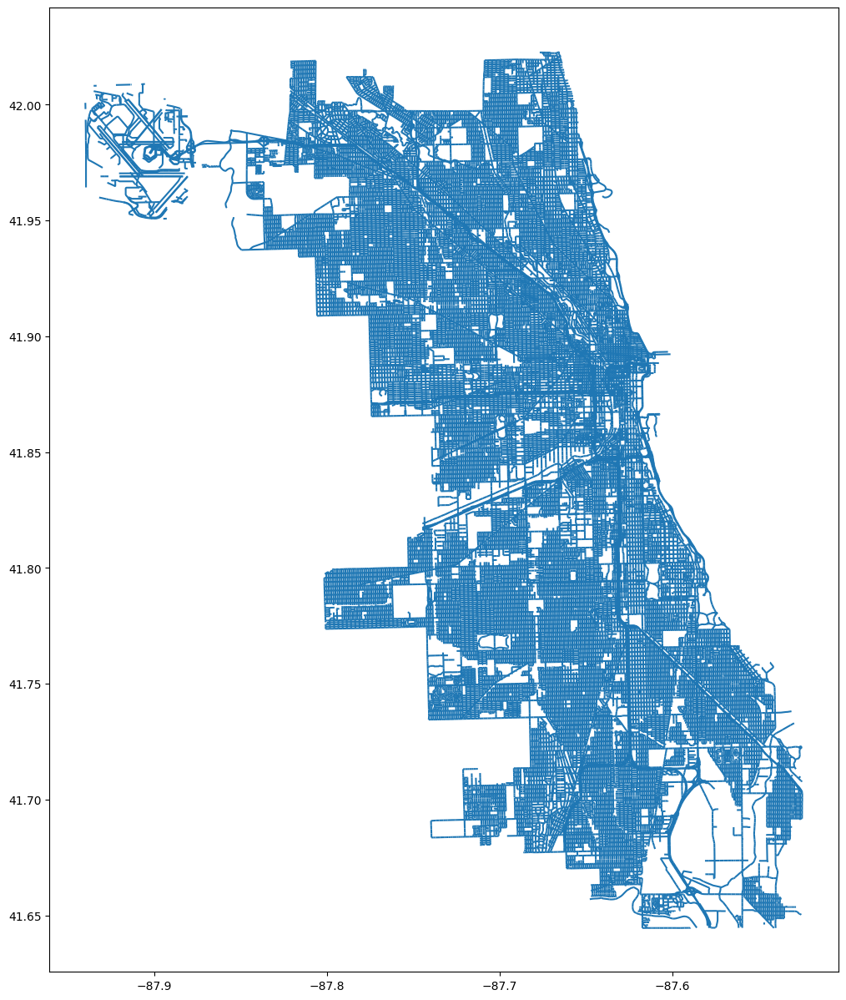

In [10]:
street_map = gpd.read_file('geo_export_89318034-d267-4e10-9151-1a78ad9765e8.shp')
fig1, ax1 = plt.subplots(figsize=(15,15))
street_map.plot(ax=ax1)

In [11]:
crs = {'init': 'epsg:4326'}
df_2022.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
Date,,,,,,,,,,,,,,,,,,,,,
2022-03-16 14:00:00,12648362,JF181248,2022-03-16 14:00:00,045XX S VINCENNES AVE,1130,DECEPTIVE PRACTICE,FRAUD OR CONFIDENCE GAME,RESIDENCE,False,False,...,3.0,38.0,11,1180381.0,1874867.0,2022,04/06/2023 05:05:58 PM,41.811898,-87.613884,"(41.811898033, -87.613883795)"
2022-09-21 11:54:00,27083,JF402513,2022-09-21 11:54:00,012XX S KEELER AVE,0110,HOMICIDE,FIRST DEGREE MURDER,STREET,False,False,...,24.0,29.0,01A,1148576.0,1894174.0,2022,09/29/2022 04:45:43 PM,41.865550,-87.730047,"(41.865550441, -87.730046943)"
2022-01-15 02:15:00,12592807,JF113312,2022-01-15 02:15:00,073XX S PHILLIPS AVE,1310,CRIMINAL DAMAGE,TO PROPERTY,APARTMENT,False,False,...,7.0,43.0,14,1193919.0,1856789.0,2022,01/03/2023 03:46:28 PM,41.761969,-87.564820,"(41.76196912, -87.564820445)"
2022-01-15 01:54:00,12592802,JF113304,2022-01-15 01:54:00,069XX S LAFAYETTE AVE,1310,CRIMINAL DAMAGE,TO PROPERTY,RESTAURANT,False,False,...,6.0,69.0,14,1177024.0,1859232.0,2022,01/03/2023 03:46:28 PM,41.769070,-87.626668,"(41.769070498, -87.626668445)"
2022-01-15 02:57:00,12592845,JF113335,2022-01-15 02:57:00,008XX S CICERO AVE,0460,BATTERY,SIMPLE,STREET,False,False,...,24.0,25.0,08B,1144522.0,1895783.0,2022,01/03/2023 03:46:28 PM,41.870043,-87.744889,"(41.870042954, -87.744889046)"


In [12]:
geometry = [Point(xy) for xy in zip(df_2022['Longitude'], df_2022['Latitude'])]
geometry[:3]

[<POINT (-87.6 41.8)>, <POINT (-87.7 41.9)>, <POINT (-87.6 41.8)>]

In [13]:
geo_df_2022 = gpd.GeoDataFrame(df_2022, #specify the data
                                crs=crs, #specify the coordinate reference system
                                geometry=geometry) #specify the geometry list created
geo_df_2022.head()


/home/cwilli15/anaconda3/envs/py3_10/lib/python3.10/site-packages/pyproj/crs/crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location,geometry
Date,,,,,,,,,,,,,,,,,,,,,
2022-03-16 14:00:00,12648362,JF181248,2022-03-16 14:00:00,045XX S VINCENNES AVE,1130,DECEPTIVE PRACTICE,FRAUD OR CONFIDENCE GAME,RESIDENCE,False,False,...,38.0,11,1180381.0,1874867.0,2022,04/06/2023 05:05:58 PM,41.811898,-87.613884,"(41.811898033, -87.613883795)",POINT (-87.61388 41.81190)
2022-09-21 11:54:00,27083,JF402513,2022-09-21 11:54:00,012XX S KEELER AVE,0110,HOMICIDE,FIRST DEGREE MURDER,STREET,False,False,...,29.0,01A,1148576.0,1894174.0,2022,09/29/2022 04:45:43 PM,41.865550,-87.730047,"(41.865550441, -87.730046943)",POINT (-87.73005 41.86555)
2022-01-15 02:15:00,12592807,JF113312,2022-01-15 02:15:00,073XX S PHILLIPS AVE,1310,CRIMINAL DAMAGE,TO PROPERTY,APARTMENT,False,False,...,43.0,14,1193919.0,1856789.0,2022,01/03/2023 03:46:28 PM,41.761969,-87.564820,"(41.76196912, -87.564820445)",POINT (-87.56482 41.76197)
2022-01-15 01:54:00,12592802,JF113304,2022-01-15 01:54:00,069XX S LAFAYETTE AVE,1310,CRIMINAL DAMAGE,TO PROPERTY,RESTAURANT,False,False,...,69.0,14,1177024.0,1859232.0,2022,01/03/2023 03:46:28 PM,41.769070,-87.626668,"(41.769070498, -87.626668445)",POINT (-87.62667 41.76907)
2022-01-15 02:57:00,12592845,JF113335,2022-01-15 02:57:00,008XX S CICERO AVE,0460,BATTERY,SIMPLE,STREET,False,False,...,25.0,08B,1144522.0,1895783.0,2022,01/03/2023 03:46:28 PM,41.870043,-87.744889,"(41.870042954, -87.744889046)",POINT (-87.74489 41.87004)


In [ ]:
# fig, ax = plt.subplots(figsize=(24, 20))
# usa.boundary.plot(ax=ax,
#                   color='black',
#                   linewidth=0.01)
# fig.tight_layout(pad=0.5)
# fig.subplots_adjust(top=0.95)
# # Remove everything except the lower 48 states
# ax.set_xlim(-14100244, -7200000)
# ax.set_ylim(2600000, 6550000)
# ctx.add_basemap(ax, source=ctx.providers.OpenStreetMap.Mapnik)
#
# #fig.suptitle('Tornado Tracks in the United States (1950-2019)', fontsize=20)
#
# tornados.plot(ax=ax,
#               column='yr',
#               cmap='coolwarm', # Color codes the markers by year
#               #color='red', # Not needed if cmap is used
#               marker='v',
#               markersize=.8,
#               legend=True,
#               legend_kwds={'label': "Year",
#                            'shrink': 0.5})

Warning 1: +init=epsg:XXXX syntax is deprecated. It might return a CRS with a non-EPSG compliant axis order.


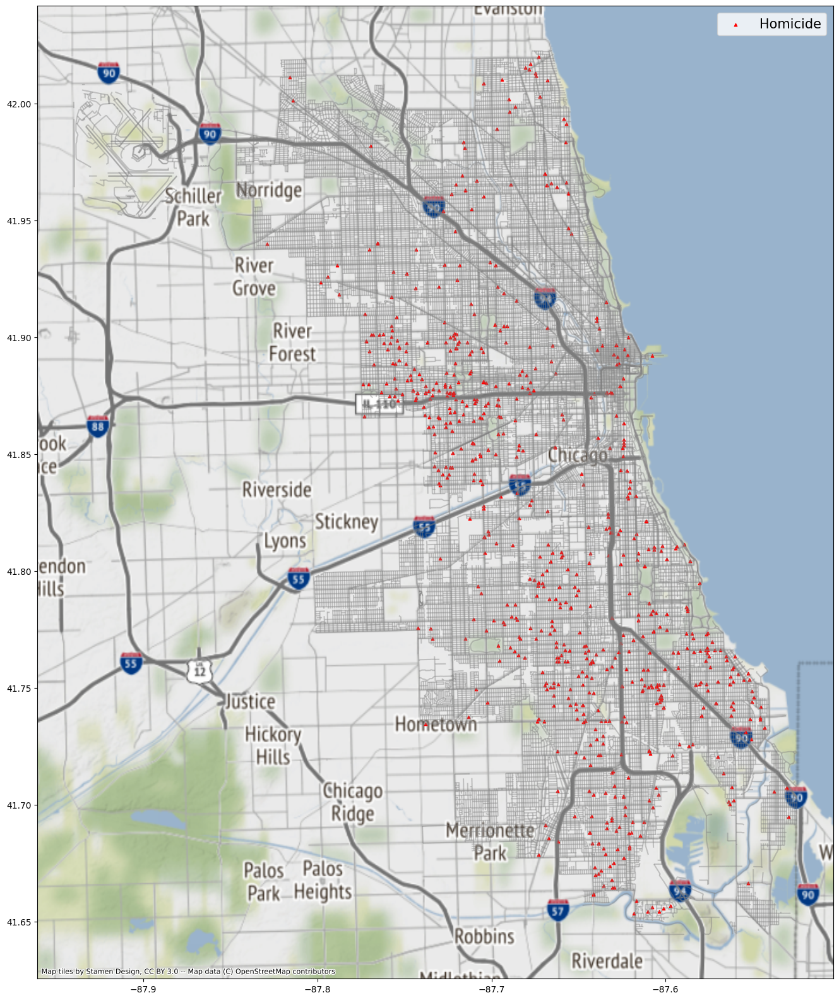

In [14]:
# This will change the markers and labels.
fig1, ax1 = plt.subplots(figsize=(20,20))
street_map.plot(ax=ax1, alpha=0.4,
                color='grey'
                )
ctx.add_basemap(ax1, crs=geo_df_2022.crs.to_string(), source=ctx.providers.Stamen.Terrain)
# geo_df_2022[geo_df_2022['Primary Type'] == 'THEFT'].plot(ax=ax1,
#                                        markersize=10,
#                                        color='blue',
#                                        marker='o',
#                                        label='Theft')
# geo_df_2022[geo_df_2022['Primary Type'] == 'BATTERY'].plot(ax=ax1,
#                                        markersize=10,
#                                        color='yellow',
#                                        marker='^',
#                                        label='Battery')
geo_df_2022[geo_df_2022['Primary Type'] == 'HOMICIDE'].plot(ax=ax1,
                                       markersize=10,
                                       color='red',
                                       marker='^',
                                       label='Homicide')
# geo_df_2022[geo_df_2022['Primary Type'] == 'CRIMINAL DAMAGE'].plot(ax=ax1,
#                                        markersize=20,
#                                        color='green',
#                                        marker='^',
#                                        label='Criminal Damage')

plt.legend(prop={'size':15})


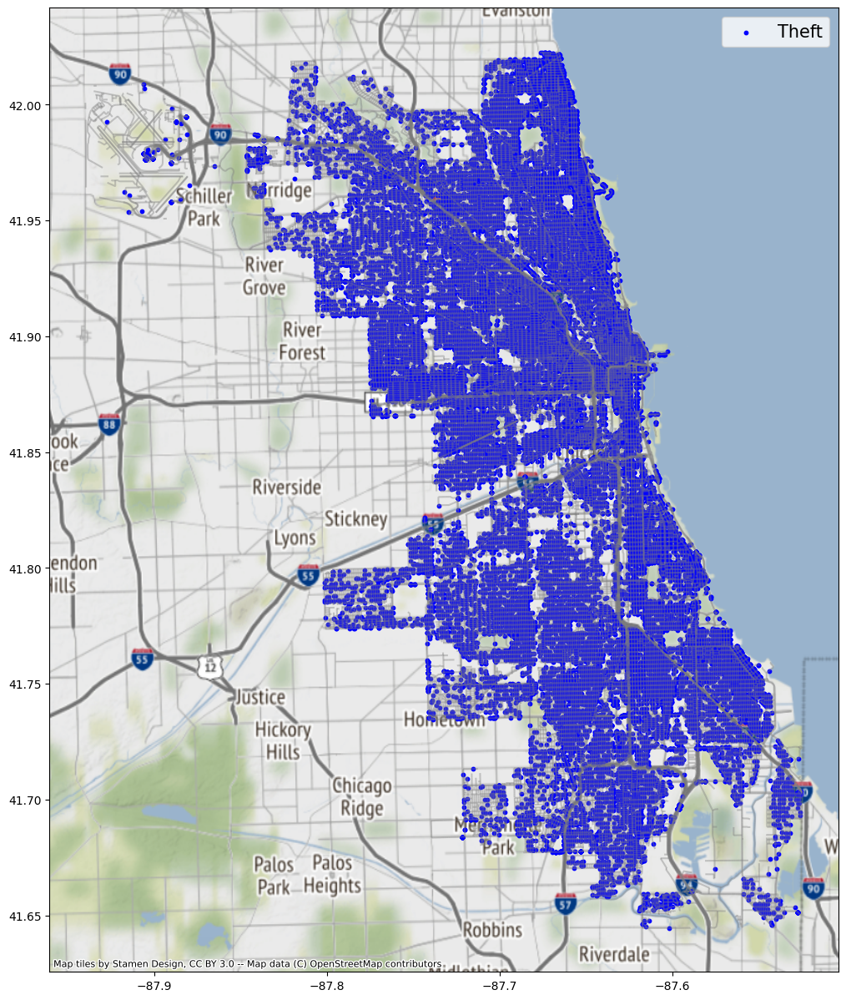

In [15]:
fig1, ax1 = plt.subplots(figsize=(15,15))
street_map.plot(ax=ax1, alpha=0.4, color='grey')
ctx.add_basemap(ax1, crs=geo_df_2022.crs.to_string(), source=ctx.providers.Stamen.Terrain)
geo_df_2022[geo_df_2022['Primary Type'] == 'THEFT'].plot(ax=ax1,
                                       markersize=10,
                                       color='blue',
                                       marker='o',
                                       label='Theft')
plt.legend(prop={'size':15})

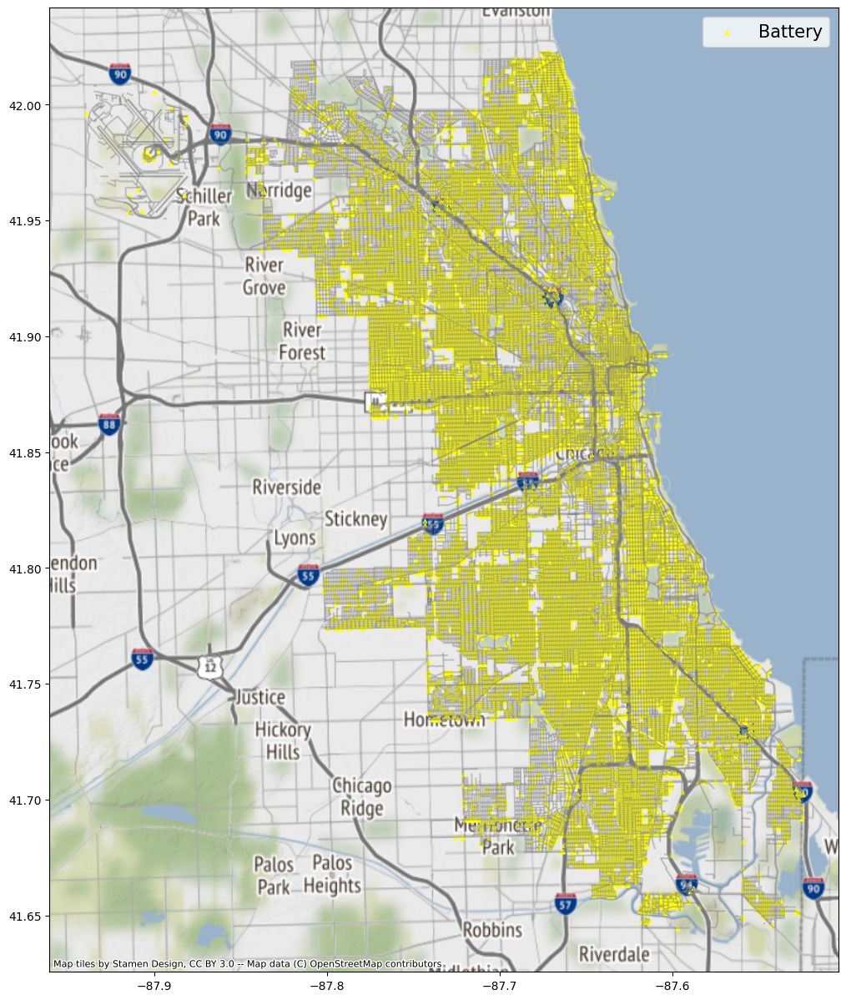

In [16]:
fig1, ax1 = plt.subplots(figsize=(15,15))
street_map.plot(ax=ax1, alpha=0.4, color='grey')
ctx.add_basemap(ax1, crs=geo_df_2022.crs.to_string(), source=ctx.providers.Stamen.Terrain)
geo_df_2022[geo_df_2022['Primary Type'] == 'BATTERY'].plot(ax=ax1,
                                       markersize=10,
                                       color='yellow',
                                       marker='^',
                                       label='Battery')
plt.legend(prop={'size':15})

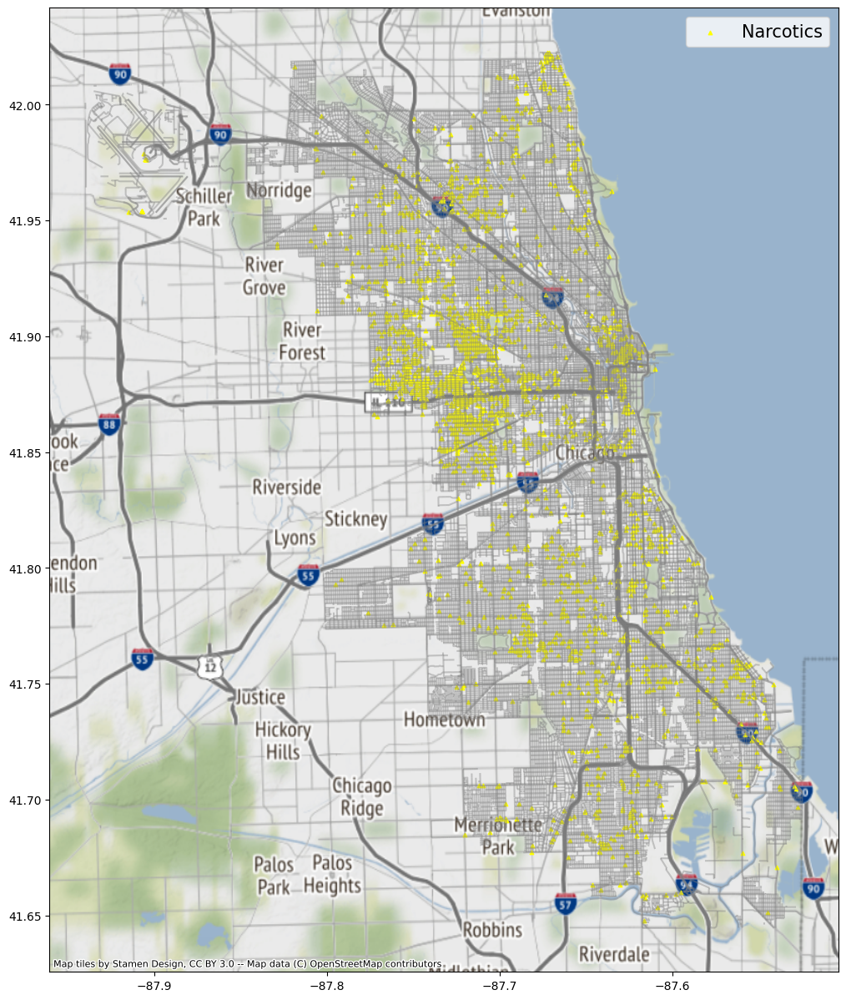

In [17]:
fig1, ax1 = plt.subplots(figsize=(15,15))
street_map.plot(ax=ax1, alpha=0.4, color='grey')
ctx.add_basemap(ax1, crs=geo_df_2022.crs.to_string(), source=ctx.providers.Stamen.Terrain)
geo_df_2022[geo_df_2022['Primary Type'] == 'NARCOTICS'].plot(ax=ax1,
                                       markersize=10,
                                       color='yellow',
                                       marker='^',
                                       label='Narcotics')
plt.legend(prop={'size':15})

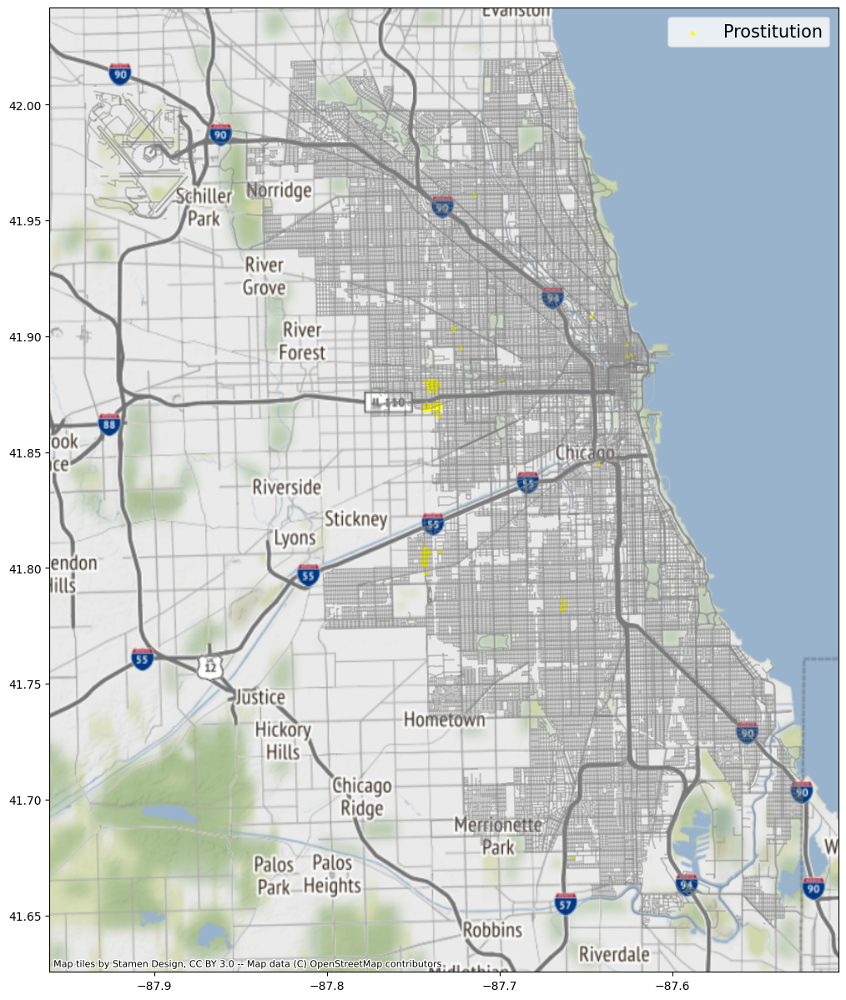

In [18]:
fig1, ax1 = plt.subplots(figsize=(15,15))
street_map.plot(ax=ax1, alpha=0.4, color='grey')
ctx.add_basemap(ax1, crs=geo_df_2022.crs.to_string(), source=ctx.providers.Stamen.Terrain)
geo_df_2022[geo_df_2022['Primary Type'] == 'PROSTITUTION'].plot(ax=ax1,
                                       markersize=10,
                                       color='yellow',
                                       marker='^',
                                       label='Prostitution')
plt.legend(prop={'size':15})

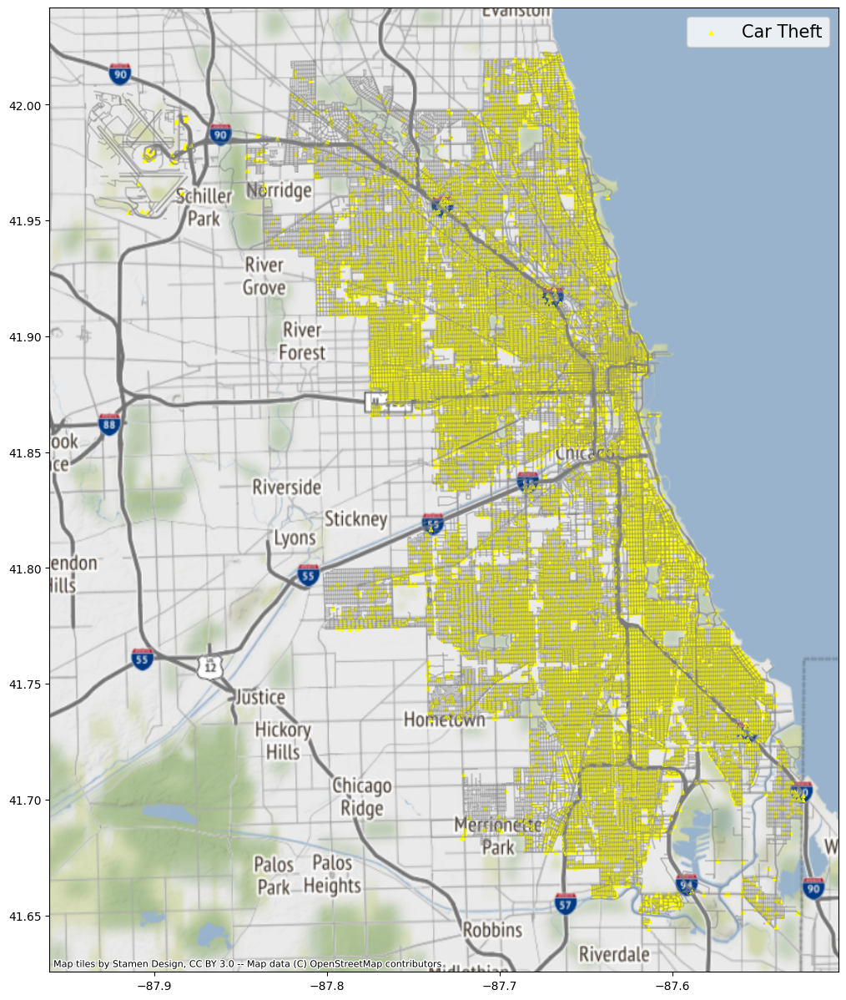

In [19]:
fig1, ax1 = plt.subplots(figsize=(15,15))
street_map.plot(ax=ax1, alpha=0.4, color='grey')
ctx.add_basemap(ax1, crs=geo_df_2022.crs.to_string(), source=ctx.providers.Stamen.Terrain)
geo_df_2022[geo_df_2022['Primary Type'] == 'MOTOR VEHICLE THEFT'].plot(ax=ax1,
                                       markersize=10,
                                       color='yellow',
                                       marker='^',
                                       label='Car Theft')
plt.legend(prop={'size':15})

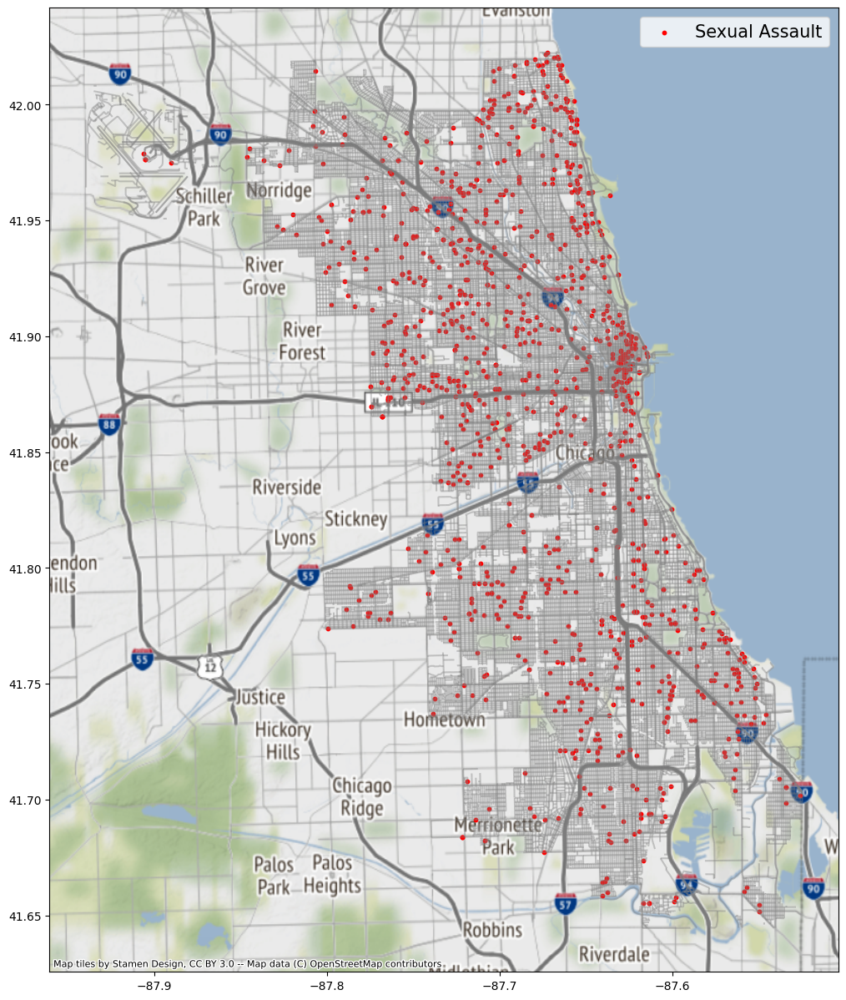

In [20]:
fig1, ax1 = plt.subplots(figsize=(15,15))
street_map.plot(ax=ax1, alpha=0.4, color='grey')
ctx.add_basemap(ax1, crs=geo_df_2022.crs.to_string(), source=ctx.providers.Stamen.Terrain)
geo_df_2022[geo_df_2022['Primary Type'] == 'SEX OFFENSE'].plot(ax=ax1,
                                       markersize=10,
                                       color='red',
                                       marker='o',
                                       label='Sexual Assault')
plt.legend(prop={'size':15})

<h2><center><b><a href = 'https://geopandas.org/en/stable/gallery/plotting_with_folium.html'>Geopandas and Folium</a></b></center></h2>

In [ ]:
# geometry = gpd.points_from_xy(df_2022.Longitude, df_2022.Latitude)
# geo_df_2022_folium = gpd.GeoDataFrame(df_2022, geometry=geometry)


In [ ]:
#

In [ ]:
# chicago_map_2022 = folium.Map(location=[41.8781, -87.6298],
#                               tiles='OpenStreetMap',
#                               zoom_start=11)
#
# chicago_map_2022


In [ ]:
# geo_df_2022_list = [[point.xy[1][0], point.xy[0][0]] for point in geo_df_2022_folium.geometry]
#
# # iterate through the list of points
# i = 0
# for coordinates in geo_df_2022_list:
#     # assign color marker for type of crime
#     if geo_df_2022_folium['Primary Type'][i] == 'HOMICIDE':
#         type_color = 'red'
#     elif geo_df_2022_folium['Primary Type'][i] == 'ASSAULT':
#         type_color = 'orange'
#     elif geo_df_2022_folium['Primary Type'][i] == 'BATTERY':
#         type_color = 'blue'
#     else:
#         type_color = 'beige'
#
# # Place the marker with the popup labels and data
#     chicago_map_2022.add_child(
#         folium.Marker(
#             location=coordinates,
#             popup=geo_df_2022_folium['Description'],
#             icon=folium.Icon(color="%s" % type_color)
#             )
#         )
#     i += 1


In [ ]:
# chicago_map_2022.show_in_browser()

In [ ]:
# chicago_map_2022.save('chicago_map_2022.html')
# webbrowser.open('chicago_map_2022.html')